In [1]:
include("../MathModule.jl")
using Main.MathModule
include("../GeometryModule.jl")
using Main.GeometryModule
include("../SourceModule.jl")
using Main.SourceModule
include("../MaterialModule.jl")
using Main.MaterialModule
include("../ObjectModule.jl")
using Main.ObjectModule
include("../DetectorModule.jl")
using Main.DetectorModule
include("../RayTrace.jl")
using .RayTrace

include("../IllustrationModule.jl")
using Main.IllustrationModule
using PlotlyJS


In [2]:
sources = Vector{Source}()
objects = Vector{Object}()
detectors = Vector{Detector}()
setup = Setup(sources, objects, detectors)

Setup(Source[], Object[], Detector[])

In [3]:
deg = π/180.0
lx = 2000.0
ly = 2000.0
tt = 500.0
h_cone = 10.0
r_cone = 10.0
θ_cone = 30.0*deg

geo_box = make_box(lx, ly, tt-h_cone, [0.0, 0.0, (tt-h_cone)/2.0])
geo_cone = make_cone(r_cone, r_cone+h_cone*tan(θ_cone), h_cone, [0.0, 0.0, tt-h_cone])

rectbox = Object(
    geo_box, 
    diamond_ib_mild
    # diamond_iia
)

uconcent = Object(
    geo_cone, 
    diamond_ib_mild
    # diamond_iia
)

setup.objects = [rectbox, uconcent]

num_sx = 100 # number of points along x
num_sy = 100 # number of points along y
num_sn = 10 # number of surface normals
traces_objects = PlotlyJS.GenericTrace[]
traces_box = draw_volume(geo_box, num_sx, num_sy, num_sn; color_sf="rgba(241, 248, 108, 0.3)", display=false);
traces_cone = draw_volume(geo_cone, num_sx, num_sy, num_sn; color_sf="rgba(241, 248, 108, 0.3)", display=false);

append!(traces_objects, traces_box);
append!(traces_objects, traces_cone);

In [4]:
nv_depth = 0.5
center_ps = [0.0, 0.0, tt - nv_depth]
psource = PointSource(
    Frame(center_ps, rm_eye),
    0.680, #[um]
    1.0, 
    isotropic_distribution()
)
setup.sources = [psource]
num_bundle = 10 # number of ray bundles
size_bundle = 1000 # size of a bundle (i.e. how many rays in a bundle)


1000

In [16]:
count_interval = size_bundle
det_tjrecord = TrajectoryRecorder(count_interval)

wd = 3000.0
na = 0.8

det_objective = Objective(
    Frame([0.0, 0.0, -wd+tt/rectbox.material.n], rm_eye),
    na,
    wd, 
    0.0
)

# r_cele = 4000.0
# geo_sphere = make_sphere(r_cele, center_ps)
# fakecelestial = Object(
#     geo_sphere, 
#     air
# )

# num_sx = 100 # number of points along x
# num_sy = 100 # number of points along y
# num_sn = 0 # number of surface normals
# traces_sphere = draw_volume(geo_sphere, num_sx, num_sy, num_sn; color_sf="rgba(160, 180, 160, 0.05)", display=false);
# append!(traces_objects, traces_sphere);

setup.detectors = [det_tjrecord, det_objective]

num_sx = 100 # number of points along x
num_sy = 100 # number of points along y
num_sn = 0 # number of surface normals
traces_objective = draw_surface(det_objective.surface, num_sx, num_sy; color="rgba(160, 180, 160, 0.2)", display=false);
append!(traces_objects, traces_objective);

In [17]:
println("Memory size of a Setup (before simulation): ", Base.summarysize(setup)/1024, "MB")

Memory size of a Setup (before simulation): 3.1796875MB


## Perform Ray Tracing Simulation

In [ ]:
threshold = 0.01
max_depth = 10
reset!(setup.detectors)
Threads.@threads for _ in 1:num_bundle
    raybundle = Ray[]
    for source in setup.sources
        append!(raybundle, emit_rays(psource, size_bundle))
    end
    hitrecord_shortest = Vector{Union{Nothing, HitRecord}}(nothing, 2)
    tjroot = TrajectoryNode(raybundle[1], [])
    trajectory = Trajectory(tjroot)
    for ray in raybundle
        tjroot = TrajectoryNode(ray, [])
        trajectory.root = tjroot
        amp_terminate = threshold*ray.amplitude
        propagate_ray!(setup.objects, ray, hitrecord_shortest, tjroot, 0;
                       t_min=1e-6, t_max=1e6, amp_terminate=amp_terminate, depth_max=max_depth)
        for detector in setup.detectors
            detect!(detector, trajectory)
        end
        # println("Memory size of a trajectory: ", Base.summarysize(trajectory)/1024, " MB")
    end
end

In [19]:
Threads.nthreads()

12

In [20]:
println("Memory size of a Setup (before simulation): ", Base.summarysize(setup)/1024, " MB")

Memory size of a Setup (before simulation): 27.8671875 MB


In [21]:
fieldintensity = det_objective.collection/num_bundle/size_bundle
println("Field Intensity collected by Objective: $(round(fieldintensity * 100.0, digits=3))%")

Field Intensity collected by Objective: 6.879%


In [22]:
traces_trajectories = GenericTrace[]
for tj in det_tjrecord.trajectories
    trace_tj = draw_trajectory(tj; color="rgba(255,0,0,1)", sizemode="fixed", draw_cone=false, display=false)
    append!(traces_trajectories, trace_tj)
end
layout = PlotlyJS.Layout(
title="Ray Trajectories",
width=800,   # Set width in pixels
height=600,  # Set height in pixels
scene=attr(
    xaxis=attr(visible=false, showgrid=false, zeroline=false),
    yaxis=attr(visible=false, showgrid=false, zeroline=false),
    zaxis=attr(visible=false, showgrid=false, zeroline=false),
    bgcolor="rgba(255,255,255,1)", 
    aspectmode="data"
),
paper_bgcolor="rgba(255,255,255,1)", 
showlegend=false
)

# Display the plot
fig = PlotlyJS.plot(vcat(traces_objects, traces_trajectories), layout);

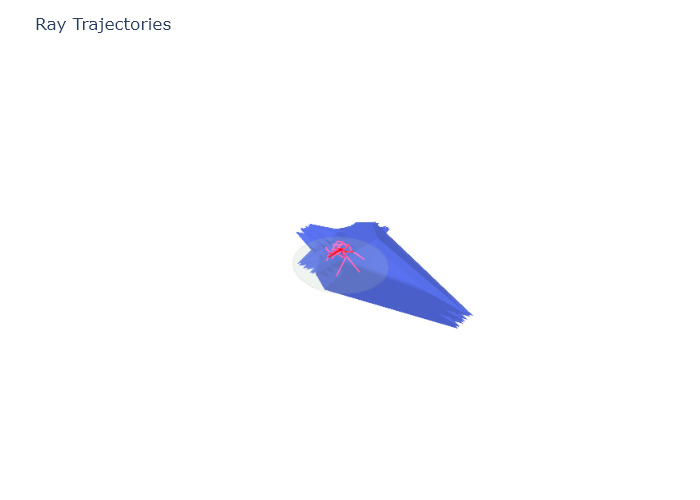

In [23]:
PlotlyJS.display(fig)